<a href="https://colab.research.google.com/github/RittickSR/AIDL/blob/master/Image_Preprocessing_and_OCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 25 not upgraded.


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
from google.colab.patches import cv2_imshow

In [0]:
import pytesseract
import shutil
import os
import random
try:
 from PIL import Image
except ImportError:
 import Image

!unzip tdata_out.zip -d "/content/sample_data"

In [0]:
import re

In [0]:
import cv2
import numpy as np

img = cv2.imread('img.jpg')

# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# noise removal
def remove_noise(image):
    return cv2.medianBlur(image,5)
 
#thresholding
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

#dilation
def dilate(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.dilate(image, kernel, iterations = 1)
    
#erosion
def erode(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernel, iterations = 1)

#opening - erosion followed by dilation
def opening_im(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

def canny(image):
    return cv2.Canny(image, 100, 200)

#skew correction
def deskew(image):
    coords = np.column_stack(np.where(image > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

In [0]:
import tempfile
def set_image_dpi(file_path):
    im = Image.open(file_path)
    length_x, width_y = im.size
    factor = min(1, float(1024.0 / length_x))
    size = int(factor * length_x), int(factor * width_y)
    im_resized = im.resize(size, Image.ANTIALIAS)
    temp_file = tempfile.NamedTemporaryFile(delete=False,   suffix='.png')
    temp_filename = temp_file.name
    im_resized.save(temp_filename, dpi=(300, 300))
    return temp_filename

In [0]:
def resize_us(image):
  scale_percent = 35 # percent of original size
  width = int(image.shape[1] * scale_percent / 100)
  height = int(image.shape[0] * scale_percent / 100)
  dim = (width, height)
  # resize image
  return(cv2.resize(image, dim, interpolation = cv2.INTER_AREA))

In [0]:
from google.colab.patches import cv2_imshow

In [0]:
import matplotlib.pyplot as plt
def preprocess(file_path):
  image = cv2.imread(file_path)
  #image=cv2.bitwise_not(image)
  ##image=resize_us(image)
  image=get_grayscale(image)
  thresh1 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                          cv2.THRESH_BINARY, 199, 5)

  alpha = -1
  beta = 255
  image= alpha * image + beta
  #image=cv2.bitwise_not(thresh1)
  cv2.imwrite(file,image)
  '''extractedInformation = pytesseract.image_to_string(image)
  print(extractedInformation)'''

In [0]:
import cv2
import os
import glob
import xlwt
i=1
wb=xlwt.Workbook('/content/drive/My Drive/m_rcnn')
sheet1=wb.add_sheet('Sheet 1')
path='/content/drive/My Drive/m_rcnn/image/*.*'
for file in glob.glob(path):
  image=cv2.imread(file)
  extractedInformation = pytesseract.image_to_string(image)
  sheet1.write(i,0,file)
  sheet1.write(i,1,extractedInformation)
  i=i+1

/content/drive/My Drive/Zara/Za (2).jpg


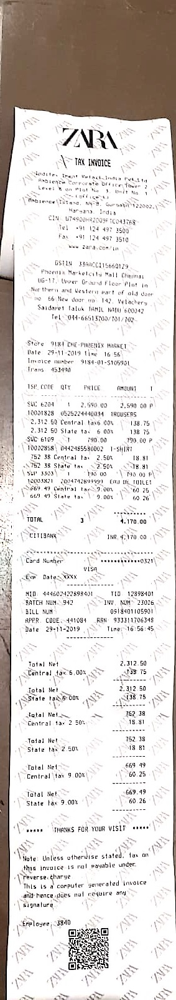

/content/drive/My Drive/Zara/Za (3).jpg


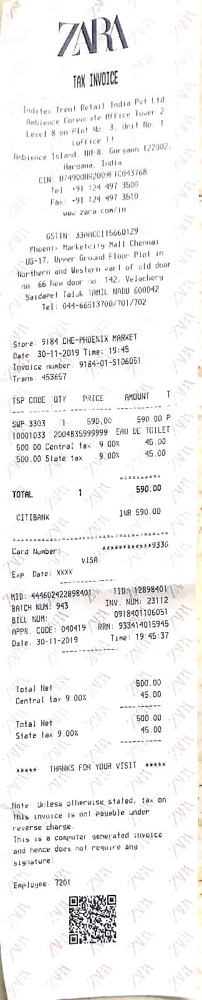

/content/drive/My Drive/Zara/Za (8).jpg


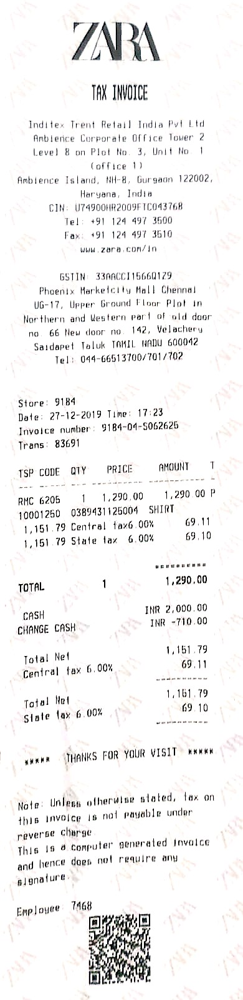

/content/drive/My Drive/Zara/Za (1).jpg


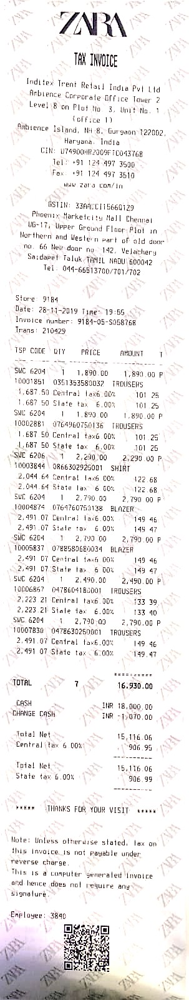

/content/drive/My Drive/Zara/Za (10).jpg


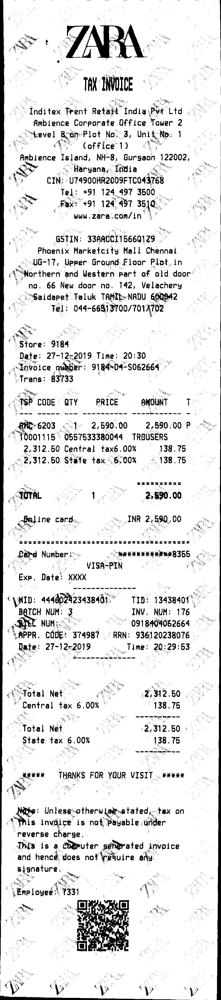

/content/drive/My Drive/Zara/Za (9).jpg


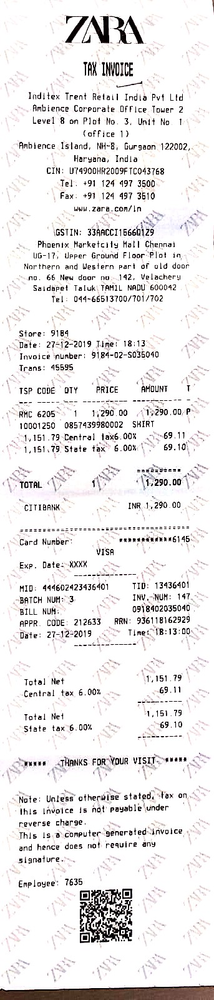

/content/drive/My Drive/Zara/Za (4).jpg


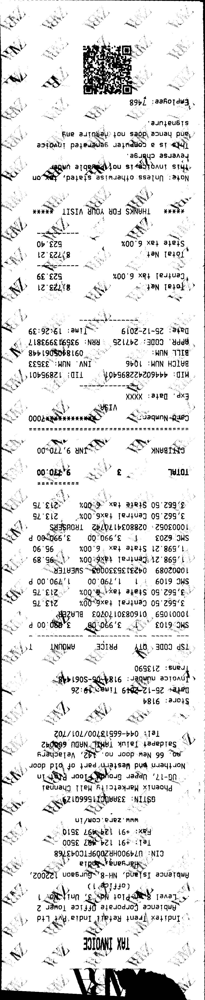

/content/drive/My Drive/Zara/Za (7).jpg


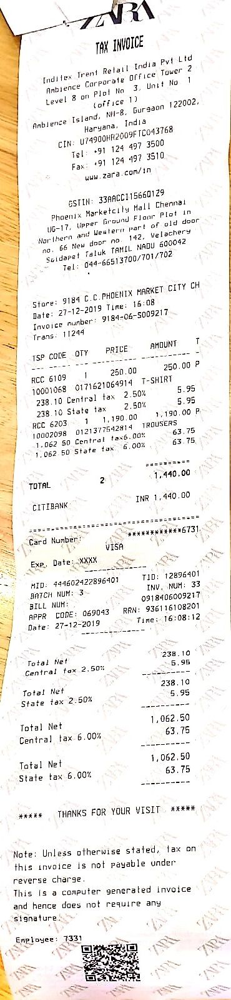

/content/drive/My Drive/Zara/Za (6).jpg


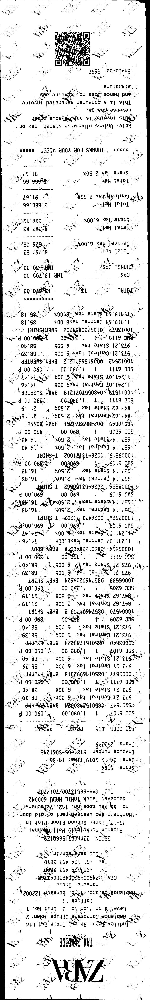

/content/drive/My Drive/Zara/Za (5).jpg


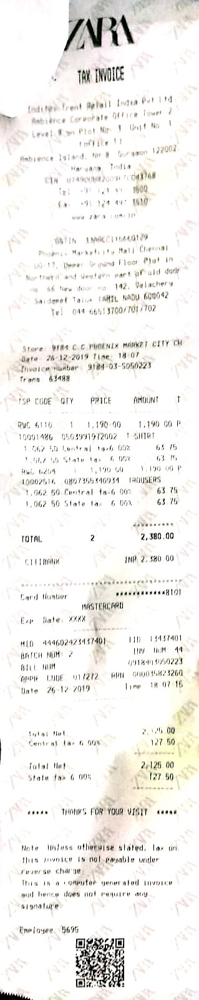

In [0]:
path='/content/drive/My Drive/Zara/*.*'
for file in glob.glob(path):
  print(file)
  image = cv2.imread(file)
  cv2_imshow(image)
  preprocess(file)

In [0]:
image = cv2.imread('/content/drive/My Drive/updated/train/Pi (7).jpg')
cv2_imshow(image)

In [0]:
def refile(file_name):
  print ("Original")
  cv2_imshow(file_name)
  width = int(file_name.shape[1])
  height = int(file_name.shape[0])
  dim = (width, height)
  # resize image
  img=cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
  print("Resized")
  cv2_imshow(img)
  cv2.imwrite(file_name,image)

SyntaxError: ignored

In [0]:
import os
import glob
for file in glob.glob('/content/drive/My Drive/updated/Zara/*.*'):
  refile(cv2.imread(file))

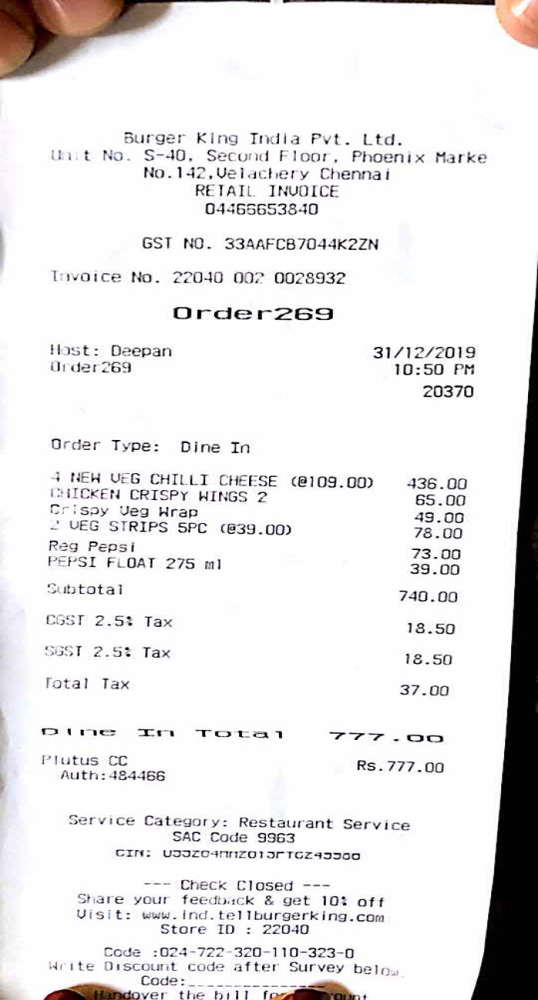

In [0]:
refile(cv2.imread('/content/drive/My Drive/DATA_BILL/test/Bur (3).png'))

In [0]:
from PIL import Image
def chsize(file):
  image=Image.open(file)
  image = image.resize((300, 1300), Image.ANTIALIAS)
  image = image.save(file)
for file in glob.glob('/content/drive/My Drive/Zara/*.*'):
  chsize(file)

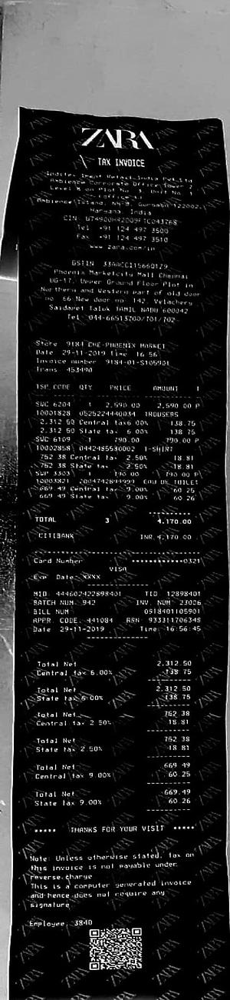

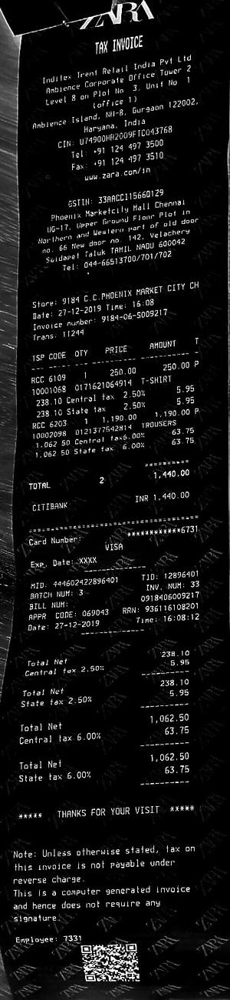

In [0]:
image=cv2.imread('/content/drive/My Drive/Zara/Za (2).jpg')
cv2_imshow(image)
cv2_imshow(cv2.imread('/content/drive/My Drive/Zara/Za (7).jpg'))